# Lending Club Case Study

### Problem Statement:
Consumer finance company specialises in lending various types of loans to urban customers.When the company receives a loan application, the company has to make a decision for loan approval based on the applicant’s profile.

The company aims to reduce credit loss by identifying risky loan applicants. Specifically, they want to understand the driving factors or variables that strongly indicate loan default.

The customers labeled as 'charged-off' are considered defaulters.

### Importing necessary libraries

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

### Data loading

In [2]:
# Load the dataset (loan.csv) provided or the anlysis 
loan_df = pd.read_csv('loan.csv')

### Data Understanding

In [3]:
# Print first 5 datapoints
loan_df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [4]:
# Understand the shape of the dataset
loan_df.shape

# Note: Dataset has 39717 rows and 111 columns

(39717, 111)

In [5]:
# Fetch the information about the dataset
loan_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


In [6]:
# Gain the statistic info about the dataset.
# Will delve into each features in later point of time
loan_df.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,...,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,...,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,...,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
50%,6.656650e+05,8.508120e+05,10000.000000,9600.000000,8975.000000,280.220000,5.900000e+04,13.400000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
75%,8.377550e+05,1.047339e+06,15000.000000,15000.000000,14400.000000,430.780000,8.230000e+04,18.600000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,11.000000,8.000000,...,NaN,NaN,NaN,NaN,2.000000,0.0,NaN,NaN,NaN,NaN


## Data Cleaning

#### Fix Rows and Cloumns
    Incorrect rows - None (no header rows, footer rows)
    Missing Column Names - None (Column names as blanks, NA, XX etc)
    Inconsistent column names - None
    Misaligned columns - None

### Missing value check

In [7]:
# Find the columns having null values in percentage
100*loan_df.isnull().mean()

id                              0.000000
member_id                       0.000000
loan_amnt                       0.000000
funded_amnt                     0.000000
funded_amnt_inv                 0.000000
                                 ...    
tax_liens                       0.098195
tot_hi_cred_lim               100.000000
total_bal_ex_mort             100.000000
total_bc_limit                100.000000
total_il_high_credit_limit    100.000000
Length: 111, dtype: float64

In [8]:
# Number of columns having the null values less than 40%
print ("Total number of columns having null values less than 40%: ",len(loan_df.columns[100*loan_df.isnull().mean() < 40]))

Total number of columns having null values less than 40%:  54


In [9]:
# Number of columns having the null values greater than 40%
print ("Total number of columns having null values greater than 40%: ",len(loan_df.columns[100*loan_df.isnull().mean() > 40]))

Total number of columns having null values greater than 40%:  57


In [10]:
Columns_not_consider=loan_df.columns[100*loan_df.isnull().mean() > 40]

In [11]:
print(Columns_not_consider)

Index(['mths_since_last_delinq', 'mths_since_last_record', 'next_pymnt_d',
       'mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint',
       'verification_status_joint', 'tot_coll_amt', 'tot_cur_bal',
       'open_acc_6m', 'open_il_6m', 'open_il_12m', 'open_il_24m',
       'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m',
       'open_rv_24m', 'max_bal_bc', 'all_util', 'total_rev_hi_lim', 'inq_fi',
       'total_cu_tl', 'inq_last_12m', 'acc_open_past_24mths', 'avg_cur_bal',
       'bc_open_to_buy', 'bc_util', 'mo_sin_old_il_acct',
       'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl',
       'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_bc_dlq',
       'mths_since_recent_inq', 'mths_since_recent_revol_delinq',
       'num_accts_ever_120_pd', 'num_actv_bc_tl', 'num_actv_rev_tl',
       'num_bc_sats', 'num_bc_tl', 'num_il_tl', 'num_op_rev_tl',
       'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats', 'num_tl_120dpd_2m',
       'num_t

#### Following columns shall be removed from the Dataset
'mths_since_last_delinq', 'mths_since_last_record', 'next_pymnt_d',
       'mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint',
       'verification_status_joint', 'tot_coll_amt', 'tot_cur_bal',
       'open_acc_6m', 'open_il_6m', 'open_il_12m', 'open_il_24m',
       'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m',
       'open_rv_24m', 'max_bal_bc', 'all_util', 'total_rev_hi_lim', 'inq_fi',
       'total_cu_tl', 'inq_last_12m', 'acc_open_past_24mths', 'avg_cur_bal',
       'bc_open_to_buy', 'bc_util', 'mo_sin_old_il_acct',
       'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl',
       'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_bc_dlq',
       'mths_since_recent_inq', 'mths_since_recent_revol_delinq',
       'num_accts_ever_120_pd', 'num_actv_bc_tl', 'num_actv_rev_tl',
       'num_bc_sats', 'num_bc_tl', 'num_il_tl', 'num_op_rev_tl',
       'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats', 'num_tl_120dpd_2m',
       'num_tl_30dpd', 'num_tl_90g_dpd_24m', 'num_tl_op_past_12m',
       'pct_tl_nvr_dlq', 'percent_bc_gt_75', 'tot_hi_cred_lim',
       'total_bal_ex_mort', 'total_bc_limit', 'total_il_high_credit_limit
       
Reason: Null values are more than 40%
    

In [12]:
# Fetch the columns having null values less than 40%
columns_to_consider = loan_df.columns[100*loan_df.isnull().mean() < 40]

In [13]:
len(columns_to_consider)

54

In [14]:
# Update the dataframe - Consider only those columns having null values less than 40%, remove rest all columns
loan_df = loan_df[columns_to_consider]

In [15]:
#Check the sahpe of the datframe again 
loan_df.shape

# Note: Now only 54  colums are present which has the null values less than 40%

(39717, 54)

In [16]:
# Checking the data again to see of there are any columns having null values greater than 40%
(100*loan_df.isnull().mean()).sort_values(ascending=False)

desc                          32.580507
emp_title                      6.191303
emp_length                     2.706650
pub_rec_bankruptcies           1.754916
last_pymnt_d                   0.178765
collections_12_mths_ex_med     0.140998
chargeoff_within_12_mths       0.140998
revol_util                     0.125891
tax_liens                      0.098195
title                          0.027696
last_credit_pull_d             0.005036
total_rec_prncp                0.000000
out_prncp                      0.000000
initial_list_status            0.000000
out_prncp_inv                  0.000000
total_acc                      0.000000
total_pymnt                    0.000000
total_pymnt_inv                0.000000
collection_recovery_fee        0.000000
total_rec_int                  0.000000
total_rec_late_fee             0.000000
recoveries                     0.000000
pub_rec                        0.000000
last_pymnt_amnt                0.000000
policy_code                    0.000000


In [17]:
# Dropping the column 'desc'. 
# Reason: More of description of data which might not be a relevance for the analysis
loan_df.drop(columns='desc',axis=1, inplace=True)

In [18]:
# Check the shape of the data again
loan_df.shape

# Note: Columns have reduced to 53

(39717, 53)

In [19]:
# Check if there are any duplicate rows
len(loan_df[loan_df.duplicated()])

# No duplicate rows found

0

In [20]:
loan_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 53 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          39717 non-null  int64  
 1   member_id                   39717 non-null  int64  
 2   loan_amnt                   39717 non-null  int64  
 3   funded_amnt                 39717 non-null  int64  
 4   funded_amnt_inv             39717 non-null  float64
 5   term                        39717 non-null  object 
 6   int_rate                    39717 non-null  object 
 7   installment                 39717 non-null  float64
 8   grade                       39717 non-null  object 
 9   sub_grade                   39717 non-null  object 
 10  emp_title                   37258 non-null  object 
 11  emp_length                  38642 non-null  object 
 12  home_ownership              39717 non-null  object 
 13  annual_inc                  397

In [21]:
# Check for remaining null values
loan_df.isnull().sum().sort_values(ascending=False)

emp_title                     2459
emp_length                    1075
pub_rec_bankruptcies           697
last_pymnt_d                    71
collections_12_mths_ex_med      56
chargeoff_within_12_mths        56
revol_util                      50
tax_liens                       39
title                           11
last_credit_pull_d               2
total_rec_prncp                  0
out_prncp                        0
initial_list_status              0
out_prncp_inv                    0
total_acc                        0
total_pymnt                      0
total_pymnt_inv                  0
collection_recovery_fee          0
total_rec_int                    0
total_rec_late_fee               0
recoveries                       0
pub_rec                          0
last_pymnt_amnt                  0
policy_code                      0
application_type                 0
acc_now_delinq                   0
delinq_amnt                      0
revol_bal                        0
id                  

In [22]:
# Fix the remaining null value columns
#emp_length                 1075
#pub_rec_bankruptcies        697
#last_pymnt_d                 71
#revol_util                   50
#title                        11
#last_credit_pull_d            2

In [23]:
# "pub_rec_bankruptcies" column -Denotes Number of public record bankruptcies
# null values can imputed with median
loan_df.pub_rec_bankruptcies.value_counts()

0.0    37339
1.0     1674
2.0        7
Name: pub_rec_bankruptcies, dtype: int64

In [24]:
# Impute the values in pub_rec_bankruptcies
med = loan_df['pub_rec_bankruptcies'].median()
loan_df['pub_rec_bankruptcies'] = loan_df['pub_rec_bankruptcies'].fillna(med)

In [25]:
loan_df.pub_rec_bankruptcies.isnull().sum()

0

In [26]:
# "last_pymnt_d" column - Denotes last month payment was received
# Instead of imputing null values wuth data..its better to remove them, because imputing the data with mode for date c=may not be correct.
loan_df.last_pymnt_d.head()


0    Jan-15
1    Apr-13
2    Jun-14
3    Jan-15
4    May-16
Name: last_pymnt_d, dtype: object

In [27]:
# Remove null values
loan_df = loan_df[loan_df.last_pymnt_d.notna()]

In [28]:
loan_df.last_pymnt_d.isnull().sum()

0

In [29]:
# letter of credit (LC) is a financial document issued by a bank that confirms a customer's ability to pay for goods or services. The LC acts as a form of collateral.
# Remove the null values from the column "last_credit_pull_d"
# Only 2 null values are present
loan_df = loan_df[loan_df.last_credit_pull_d.notna()]

In [30]:
loan_df.last_credit_pull_d.isnull().sum()

0

#### Following steps to be preformed to clean the data - Standardise Number, Standardise Texts,Fix Invalid values, Filter data

In [31]:
#revol_util column - Denotes Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.
# A low utilization ratio is best,keeping it below 30% is ideal

# Remove the % from the data and impute the missing values
loan_df.revol_util.value_counts()

0%        975
0.20%      62
63%        62
40.70%     58
66.70%     58
         ... 
25.74%      1
0.83%       1
47.36%      1
10.61%      1
7.28%       1
Name: revol_util, Length: 1089, dtype: int64

In [32]:
#Remove the % from the data and convert it to float
loan_df.revol_util = loan_df.revol_util.str.replace('%','').astype(float)

In [33]:
loan_df.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'purpose', 'title',
       'zip_code', 'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util',
       'total_acc', 'initial_list_status', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d',
       'collections_12_mths_ex_med', 'policy_code', 'application_type',
       'acc_now_delinq', 'chargeoff_within_12_mths', 'delinq_amnt',
       'pub_rec_bankruptcies', 'tax_liens'],
      dtype='object')

In [34]:
# Rename the column revol_util to revol_util_percent . This will indictae the values in the column is in percentage
loan_df=loan_df.rename(columns={"revol_util":"revol_util_percent"})

In [35]:
loan_df.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'purpose', 'title',
       'zip_code', 'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util_percent', 'total_acc', 'initial_list_status', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp',
       'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'last_credit_pull_d', 'collections_12_mths_ex_med', 'policy_code',
       'application_type', 'acc_now_delinq', 'chargeoff_within_12_mths',
       'delinq_amnt', 'pub_rec_bankruptcies', 'tax_liens'],
      dtype='object')

In [36]:
loan_df.revol_util_percent.isnull().sum()

46

In [37]:
loan_df.revol_util_percent.head()

0    83.7
1     9.4
2    98.5
3    21.0
4    53.9
Name: revol_util_percent, dtype: float64

In [38]:
# Get the median
rvol_med = loan_df.revol_util_percent.median()

In [39]:
# Impute with median
loan_df.revol_util_percent = loan_df.revol_util_percent.fillna(rvol_med)

In [40]:
loan_df.revol_util_percent.isnull().sum()

0

In [41]:
# "emp_length" column - Denotes Employment length in years
# The data in the column has <,>,+ symbols, which has to be removed and retaining only the numbers.
# After that impute the null values with median
loan_df.emp_length.value_counts()

10+ years    8870
< 1 year     4574
2 years      4382
3 years      4088
4 years      3428
5 years      3272
1 year       3229
6 years      2228
7 years      1772
8 years      1476
9 years      1255
Name: emp_length, dtype: int64

In [42]:
# Convert the column emp_length to string for filtering the data
loan_df.emp_length = loan_df.emp_length.astype(str)

In [43]:
loan_df.emp_length = loan_df.emp_length.str.replace('+','')

In [44]:
# The data in the column has <,>,+,years , This has to be removed and retain only the numbers.
# O denore less than an year. 10 denotes 10 or more years
loan_df.emp_length = loan_df.emp_length.apply(lambda x: 0 if x.startswith('<') else int(x.split()[0]) if x.split()[0].isdigit() else None)

In [45]:
loan_df.emp_length.value_counts()

10.0    8870
0.0     4574
2.0     4382
3.0     4088
4.0     3428
5.0     3272
1.0     3229
6.0     2228
7.0     1772
8.0     1476
9.0     1255
Name: emp_length, dtype: int64

In [46]:
# Get the median for imputation 
med = loan_df.emp_length.median()

In [47]:
med

4.0

In [48]:
# Impute median value in place of null
loan_df.emp_length = loan_df.emp_length.fillna(med)

In [49]:
loan_df.emp_length.value_counts()

10.0    8870
0.0     4574
4.0     4498
2.0     4382
3.0     4088
5.0     3272
1.0     3229
6.0     2228
7.0     1772
8.0     1476
9.0     1255
Name: emp_length, dtype: int64

In [50]:
# Convert the column emp_length to int type
loan_df.emp_length.astype(int)

0        10
1         0
2        10
3        10
4         1
         ..
39712     4
39713     3
39714     0
39715     0
39716     0
Name: emp_length, Length: 39644, dtype: int32

In [51]:
# Check to see if any null values exists in emp_length
loan_df.emp_length.isnull().sum()

0

In [52]:
# "title" column - The loan title provided by the borrower
# This column contains the title provided by borrower for the loan. This can be removed as it will not serve in anlyzing the data


In [53]:
# Drop the column "title"
loan_df =loan_df.drop(columns='title',axis=1)

In [54]:
# Option to set the column numbers for viewing in the notebook
pd.set_option('display.max_columns', 53)

In [55]:
loan_df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,purpose,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util_percent,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10.0,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,credit_card,860xx,AZ,27.65,0,Jan-85,1,3,0,13648,83.7,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,0.0,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,car,309xx,GA,1.00,0,Apr-99,5,3,0,1687,9.4,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,Sep-13,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10.0,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,small_business,606xx,IL,8.72,0,Nov-01,2,2,0,2956,98.5,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10.0,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,other,917xx,CA,20.00,0,Feb-96,1,10,0,5598,21.0,37,f,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,University Medical Group,1.0,RENT,80000.0,Source Verified,Dec-11,Current,n,https://lendingclub.com/browse/loanDetail.acti...,other,972xx,OR,17.94,0,Jan-96,0,15,0,27783,53.9,38,f,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,May-16,67.79,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0


In [56]:
# Get the statistics report of all the columns
loan_df.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,emp_length,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util_percent,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,policy_code,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
count,3.964400e+04,3.964400e+04,39644.000000,39644.00000,39644.000000,39644.000000,39644.000000,3.964400e+04,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39588.0,39644.0,39644.0,39588.0,39644.0,39644.000000,39605.0
mean,6.831571e+05,8.504905e+05,11225.073151,10952.84217,10403.925605,324.699200,4.948643,6.900832e+04,13.317752,0.146277,0.868454,9.298330,0.054989,13394.975734,48.831793,22.100267,51.322218,51.083660,12174.756901,11587.345016,9811.292535,2267.810941,1.365525,94.287981,12.296210,2683.750099,0.0,1.0,0.0,0.0,0.0,0.042428,0.0
std,2.107102e+05,2.657028e+05,7455.197984,7185.40898,7128.300533,208.818933,3.517974,6.383481e+04,6.677311,0.491143,1.069761,4.400522,0.237075,15893.011532,28.315712,11.400905,375.511662,374.162076,9036.616466,8938.240471,7059.614927,2608.716352,7.296453,685.526883,148.332033,4449.746502,0.0,0.0,0.0,0.0,0.0,0.202439,0.0
min,5.473400e+04,7.069900e+04,500.000000,500.00000,0.000000,15.690000,0.000000,4.000000e+03,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,33.730000,0.000000,0.000000,6.220000,0.000000,0.000000,0.000000,0.000000,0.0,1.0,0.0,0.0,0.0,0.000000,0.0
25%,5.162455e+05,6.668655e+05,5500.000000,5400.00000,5000.000000,167.080000,2.000000,4.050000e+04,8.180000,0.000000,0.000000,6.000000,0.000000,3710.750000,25.400000,14.000000,0.000000,0.000000,5593.887105,5137.367500,4644.590000,665.160000,0.000000,0.000000,0.000000,219.847500,0.0,1.0,0.0,0.0,0.0,0.000000,0.0
50%,6.656255e+05,8.508075e+05,10000.000000,9600.00000,8975.000000,280.500000,4.000000,5.900000e+04,13.410000,0.000000,1.000000,9.000000,0.000000,8860.000000,49.300000,20.000000,0.000000,0.000000,9928.340395,9307.275000,8000.000000,1353.185000,0.000000,0.000000,0.000000,548.550000,0.0,1.0,0.0,0.0,0.0,0.000000,0.0
75%,8.377930e+05,1.047358e+06,15000.000000,15000.00000,14400.000000,430.780000,9.000000,8.240400e+04,18.600000,0.000000,1.000000,12.000000,0.000000,17072.000000,72.300000,29.000000,0.000000,0.000000,16553.099668,15815.752500,13703.675000,2837.912500,0.000000,0.000000,0.000000,3304.707500,0.0,1.0,0.0,0.0,0.0,0.000000,0.0
max,1.077501e+06,1.314167e+06,35000.000000,35000.00000,35000.000000,1305.190000,10.000000,6.000000e+06,29.990000,11.000000,8.000000,44.000000,4.000000,149588.000000,99.900000,90.000000,6311.470000,6307.370000,58563.679930,58563.680000,35000.020000,23563.680000,180.200000,29623.350000,7002.190000,36115.200000,0.0,1.0,0.0,0.0,0.0,2.000000,0.0


In [57]:
# From the above statistics its inferred that following columns has the value 0
columns_with_zero_value = ["collections_12_mths_ex_med","acc_now_delinq","chargeoff_within_12_mths", "delinq_amnt","tax_liens" ]

In [58]:
# Dropping off the columns having value 0
loan_df.drop(columns=columns_with_zero_value,axis=1, inplace=True)

In [59]:
# Get the shape to infer the rows , columns
loan_df.shape

(39644, 47)

In [60]:
# Display columns present in the data frame
loan_df.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'purpose', 'zip_code',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util_percent', 'total_acc', 'initial_list_status', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp',
       'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'last_credit_pull_d', 'policy_code', 'application_type',
       'pub_rec_bankruptcies'],
      dtype='object')

In [61]:
loan_df.isnull().sum().sort_values(ascending=False)

emp_title                  2450
id                            0
total_pymnt_inv               0
open_acc                      0
pub_rec                       0
revol_bal                     0
revol_util_percent            0
total_acc                     0
initial_list_status           0
out_prncp                     0
out_prncp_inv                 0
total_pymnt                   0
total_rec_prncp               0
earliest_cr_line              0
total_rec_int                 0
total_rec_late_fee            0
recoveries                    0
collection_recovery_fee       0
last_pymnt_d                  0
last_pymnt_amnt               0
last_credit_pull_d            0
policy_code                   0
application_type              0
inq_last_6mths                0
delinq_2yrs                   0
member_id                     0
dti                           0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate

In [62]:
loan_df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,purpose,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util_percent,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,policy_code,application_type,pub_rec_bankruptcies
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10.0,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,credit_card,860xx,AZ,27.65,0,Jan-85,1,3,0,13648,83.7,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,May-16,1,INDIVIDUAL,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,0.0,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,car,309xx,GA,1.00,0,Apr-99,5,3,0,1687,9.4,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,Sep-13,1,INDIVIDUAL,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10.0,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,small_business,606xx,IL,8.72,0,Nov-01,2,2,0,2956,98.5,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,May-16,1,INDIVIDUAL,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10.0,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,other,917xx,CA,20.00,0,Feb-96,1,10,0,5598,21.0,37,f,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,Apr-16,1,INDIVIDUAL,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,University Medical Group,1.0,RENT,80000.0,Source Verified,Dec-11,Current,n,https://lendingclub.com/browse/loanDetail.acti...,other,972xx,OR,17.94,0,Jan-96,0,15,0,27783,53.9,38,f,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,May-16,67.79,May-16,1,INDIVIDUAL,0.0


In [63]:
# Setting the option to display the entire data in the notebook
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [64]:
# url - Denotes URL for the LC page with listing data.
# This data has only id has unique it in. id column is already present and hence can be removed.
loan_df = loan_df.drop(columns='url', axis=1)

In [65]:
# Verifying url column is removed
loan_df.columns


Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'purpose', 'zip_code',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util_percent', 'total_acc', 'initial_list_status', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp',
       'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'last_credit_pull_d', 'policy_code', 'application_type',
       'pub_rec_bankruptcies'],
      dtype='object')

In [66]:
# pymnt_plan - Indicates if a payment plan has been put in place for the loan
loan_df.pymnt_plan.value_counts()

n    39644
Name: pymnt_plan, dtype: int64

In [67]:
# All the data in pymnt_plan is n and this will not serve in analysis. This column can be removed.
loan_df = loan_df.drop(columns='pymnt_plan', axis=1)

In [68]:
#  initial_list_status - Indicate he initial listing status of the loan. Possible values are – W, F
loan_df.initial_list_status.value_counts()

f    39644
Name: initial_list_status, dtype: int64

In [69]:
# All the data in pymnt_plan is f and this will not serve in analysis. This column can be removed.
loan_df = loan_df.drop(columns='initial_list_status', axis=1)

In [70]:
# policy_code - Indicate publicly available policy_code=1, new products not publicly available policy_code=2
loan_df.policy_code.value_counts()

1    39644
Name: policy_code, dtype: int64

In [71]:
# All the data in policy_code is 1 and this will not serve in analysis. This column can be removed.
loan_df = loan_df.drop(columns='policy_code', axis=1)

In [72]:
#  application_type - Indicates whether the loan is an individual application or a joint application with two co-borrowers
loan_df.application_type.value_counts()

INDIVIDUAL    39644
Name: application_type, dtype: int64

In [73]:
# All the data in application_type is INDIVIDUAL and this will not serve in analysis. This column can be removed.
loan_df = loan_df.drop(columns='application_type', axis=1)

In [74]:
loan_df.int_rate.head()

0    10.65%
1    15.27%
2    15.96%
3    13.49%
4    12.69%
Name: int_rate, dtype: object

In [75]:
# Remove % from int_rate column
loan_df.int_rate = loan_df.int_rate.str.replace('%','').astype(float)

In [76]:
loan_df.int_rate.head()

0    10.65
1    15.27
2    15.96
3    13.49
4    12.69
Name: int_rate, dtype: float64

In [77]:
loan_df.int_rate.dtype

dtype('float64')

In [78]:
loan_df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util_percent,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies
0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,B2,NaN,10.0,RENT,24000.0,Verified,Dec-11,Fully Paid,credit_card,860xx,AZ,27.65,0,Jan-85,1,3,0,13648,83.7,9,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,May-16,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,C4,Ryder,0.0,RENT,30000.0,Source Verified,Dec-11,Charged Off,car,309xx,GA,1.00,0,Apr-99,5,3,0,1687,9.4,4,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,Sep-13,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96,84.33,C,C5,NaN,10.0,RENT,12252.0,Not Verified,Dec-11,Fully Paid,small_business,606xx,IL,8.72,0,Nov-01,2,2,0,2956,98.5,10,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,May-16,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49,339.31,C,C1,AIR RESOURCES BOARD,10.0,RENT,49200.0,Source Verified,Dec-11,Fully Paid,other,917xx,CA,20.00,0,Feb-96,1,10,0,5598,21.0,37,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,Apr-16,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69,67.79,B,B5,University Medical Group,1.0,RENT,80000.0,Source Verified,Dec-11,Current,other,972xx,OR,17.94,0,Jan-96,0,15,0,27783,53.9,38,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,May-16,67.79,May-16,0.0


In [79]:
loan_df.columns


Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'purpose', 'zip_code', 'addr_state', 'dti',
       'delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util_percent', 'total_acc', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp',
       'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'last_credit_pull_d', 'pub_rec_bankruptcies'],
      dtype='object')

In [80]:
# Convert issue_d to dateobject
loan_df['issue_d'] = pd.to_datetime(loan_df['issue_d'], format='%b-%y')

In [81]:
# Create a new column by extracting month 
loan_df['issue_month'] = pd.DatetimeIndex(loan_df['issue_d']).month

In [82]:
# Create a new column by extracting year 
loan_df['issue_year'] = pd.DatetimeIndex(loan_df['issue_d']).year

In [83]:
loan_df.issue_year.value_counts()

2011    21618
2010    11511
2009     4704
2008     1561
2007      250
Name: issue_year, dtype: int64

In [84]:
# Convert earliest_cr_line to dateobject
loan_df['earliest_cr_line'] = pd.to_datetime(loan_df['earliest_cr_line'], format='%b-%y')

In [85]:
# Create a new column by extracting month 
loan_df['earliest_cr_line_month'] = pd.DatetimeIndex(loan_df['earliest_cr_line']).month

In [86]:
# Create a new column by extracting year 
loan_df['earliest_cr_line_year'] = pd.DatetimeIndex(loan_df['earliest_cr_line']).year

In [87]:
# Create buckets for dti columns for categorical wise analysis
loan_df['dti_bucket'] = pd.qcut(loan_df.dti,[0, 0.2, 0.4, 0.6, 0.8, 1])

In [88]:
loan_df['dti_bucket'].value_counts()

(6.98, 11.38]      7934
(-0.001, 6.98]     7931
(11.38, 15.36]     7931
(19.754, 29.99]    7929
(15.36, 19.754]    7919
Name: dti_bucket, dtype: int64

In [89]:
# Create buckets for loan_amt columns for categorical wise analysis
loan_df['loan_amnt_bucket'] = pd.qcut(loan_df.loan_amnt,[0, 0.2, 0.4, 0.6, 0.8, 1])

In [90]:
loan_df['loan_amnt_bucket'].value_counts()

(499.999, 5000.0]     9530
(8000.0, 12000.0]     8755
(16750.0, 35000.0]    7916
(5000.0, 8000.0]      7778
(12000.0, 16750.0]    5665
Name: loan_amnt_bucket, dtype: int64

In [91]:
# Create buckets for funded_amnt columns for categorical wise analysis
loan_df['funded_amnt_bucket'] = pd.qcut(loan_df.funded_amnt,[0, 0.2, 0.4, 0.6, 0.8, 1])

In [92]:
loan_df['funded_amnt_bucket'].value_counts()

(499.999, 5000.0]     9613
(11200.0, 16000.0]    8208
(7800.0, 11200.0]     7958
(16000.0, 35000.0]    7551
(5000.0, 7800.0]      6314
Name: funded_amnt_bucket, dtype: int64

In [93]:
# Create buckets for int_rate columns for categorical wise analysis
loan_df['int_rate_bucket'] = pd.qcut(loan_df.int_rate,[0, 0.2, 0.4, 0.6, 0.8, 1])

In [94]:
loan_df['int_rate_bucket'].value_counts()

(7.9, 10.99]      8464
(12.87, 15.27]    8067
(5.419, 7.9]      8024
(15.27, 24.59]    7768
(10.99, 12.87]    7321
Name: int_rate_bucket, dtype: int64

In [95]:
# Create buckets for installment columns for categorical wise analysis
loan_df['installment_bucket'] = pd.qcut(loan_df.installment,[0, 0.2, 0.4, 0.6, 0.8, 1])

In [96]:
loan_df['installment_bucket'].value_counts()

(231.586, 330.76]     7967
(15.689, 150.836]     7929
(150.836, 231.586]    7929
(483.38, 1305.19]     7925
(330.76, 483.38]      7894
Name: installment_bucket, dtype: int64

In [97]:
# Create buckets for annual_inc columns for categorical wise analysis
loan_df['annual_inc_bucket'] = pd.qcut(loan_df.annual_inc,[0, 0.2, 0.4, 0.6, 0.8, 1])

In [98]:
loan_df['annual_inc_bucket'].value_counts()

(50400.0, 66000.0]      8075
(37500.0, 50400.0]      7973
(3999.999, 37500.0]     7938
(66000.0, 90000.0]      7909
(90000.0, 6000000.0]    7749
Name: annual_inc_bucket, dtype: int64

### Removal of columns

Following columns does not serve in the analysis of finding defaulters and hence it can be removed.

id -> A unique LC assigned ID for the loan listing

member_id -> A unique LC assigned Id for the borrower member.

zip_code -> The first 3 numbers of the zip code provided by the borrower in the loan application.

inq_last_6mths -> The number of inquiries in past 6 months (excluding auto and mortgage inquiries)

out_prncp_inv -> Remaining outstanding principal for portion of total amount funded by investors

total_pymnt_inv -> Payments received to date for portion of total amount funded by investors 

total_rec_prncp -> Principal received to date 

total_rec_int -> Interest received to date 

total_rec_late_fee -> Late fees received to date 

recoveries -> "Post Charge Off Gross Recovery" is the total amount of money recovered from a debt that has been charged off 

collection_recovery_fee -> post charge off collection fee 

last_pymnt_d -> Last month payment was received 

last_pymnt_amnt -> Last total payment amount received 

last_credit_pull_d -> The most recent month LC pulled credit for this loan 

revol_bal -> Total credit revolving balance.  This is the combined or total amount that a person currently owes across all their revolving credit accounts. It includes any balances that haven't been fully paid off.

revol_util_percent -> Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit


In [99]:
# Following columns can be removed as they does not serve in analysis
columns_to_remove=['id', 'member_id', 'zip_code', 'inq_last_6mths', 'out_prncp_inv', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee','recoveries', 'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d', 'emp_title', 'revol_bal',
 'revol_util_percent','out_prncp' ]


In [100]:
# Dropping the columns not in interest of analysis
loan_df = loan_df.drop(columns_to_remove, axis=1)

In [101]:
loan_df.shape

(39644, 34)

### Analysis
In this section we shall delve to understand the patterns
Univariate, Segmented univariate, bivariate , multivariate analysis shall be performed to infer the patterns.

Objective of this part of EDA would be to understand the factors contributing to default of loan.

Visualization shall be used to for analysis 

<Axes: xlabel='loan_status', ylabel='count'>

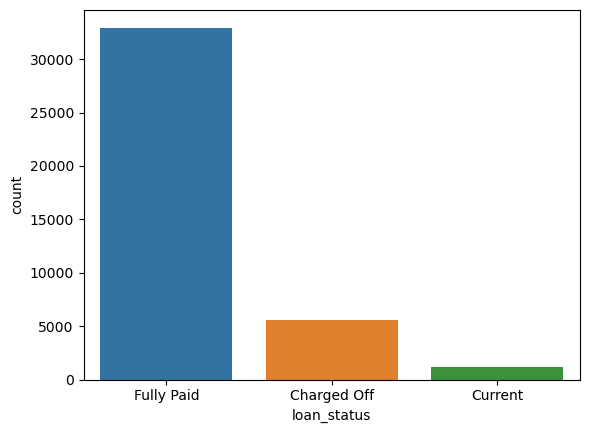

In [102]:
## General analysis of the loan status using count plot
sns.countplot(x=loan_df["loan_status"])



In [103]:
loan_df["loan_status"].value_counts()

Fully Paid     32949
Charged Off     5555
Current         1140
Name: loan_status, dtype: int64

In [104]:
# For analysis using visualization, following numerical columns shall be leveraged.
numerical_cols = [
 'emp_length',
 'delinq_2yrs',
 'pub_rec',
 'total_pymnt',
 'pub_rec_bankruptcies',
 'issue_month',
 'issue_year',
 'earliest_cr_line_year']

In [105]:
# For analysis using visualization, following categorical columns shall be leveraged.
categorical_cols = ['term',
 'grade',
 'sub_grade',
 'home_ownership',
 'verification_status',
 'purpose',
 'addr_state',
 'dti_bucket',
 'loan_amnt_bucket',
 'funded_amnt_bucket',
 'int_rate_bucket',
 'installment_bucket',
 'annual_inc_bucket']

In [106]:
# For further analyis we shall stick to Charged off category in loan_status.
# Objective here is to determine the attributes which can help to identify the defaulters

# New dataframe having only 'Charged Off' data

charged_off_df = loan_df[loan_df["loan_status"] == 'Charged Off']

In [107]:
##########################

In [108]:
# Univariate analysis (Numerical columns)

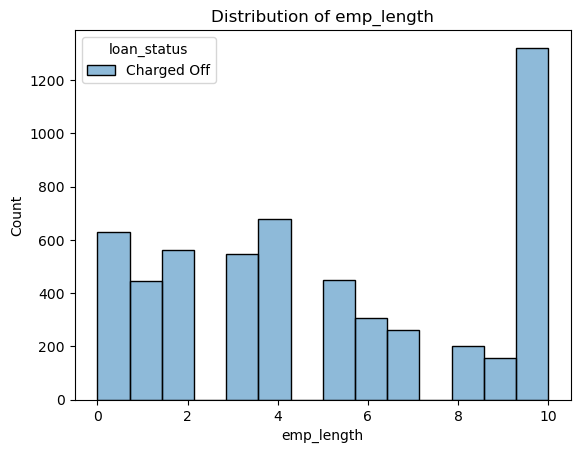

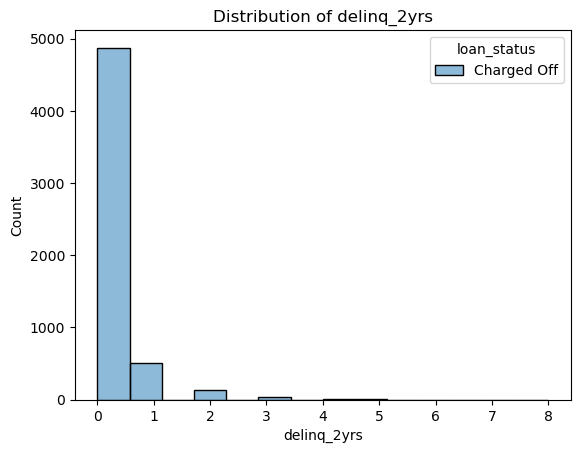

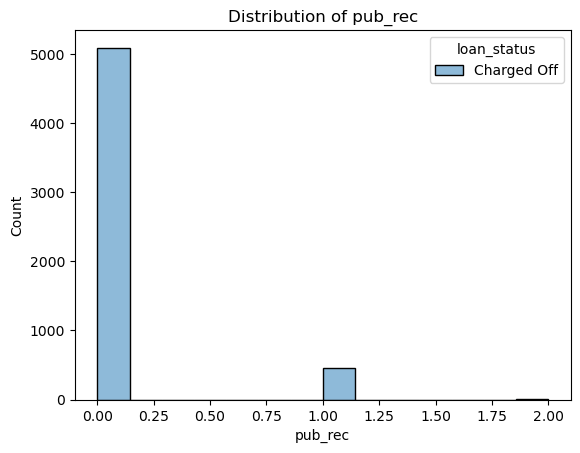

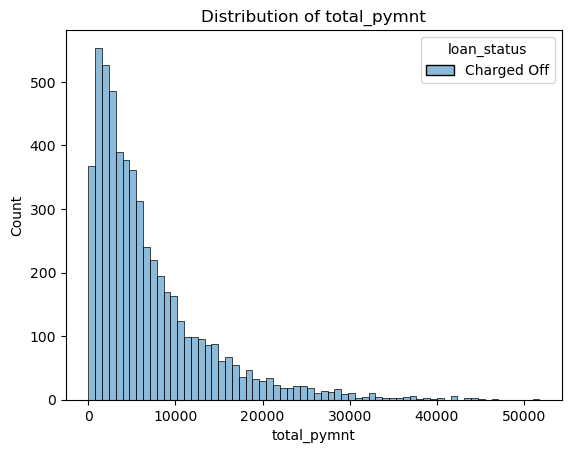

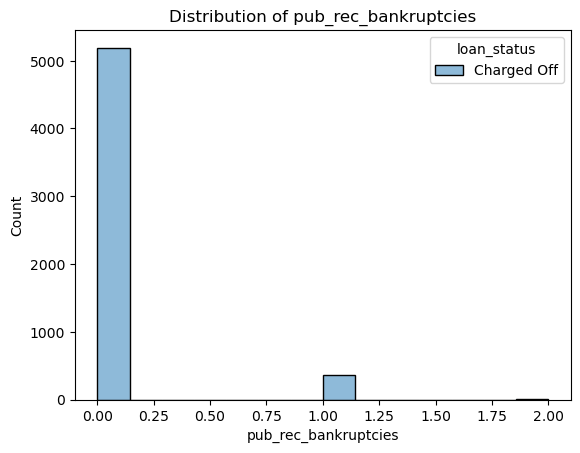

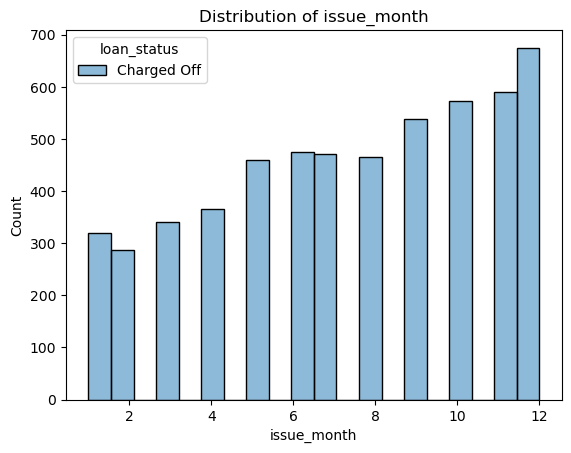

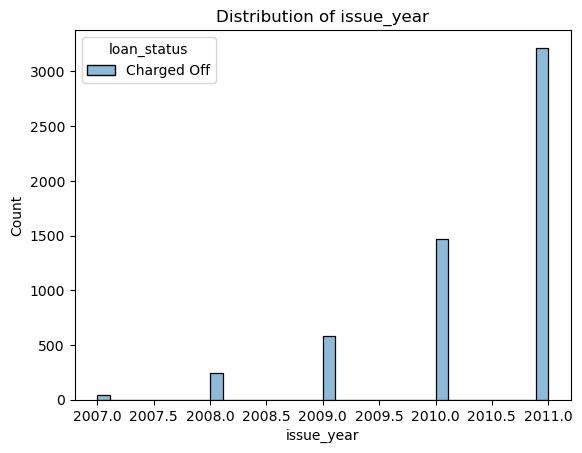

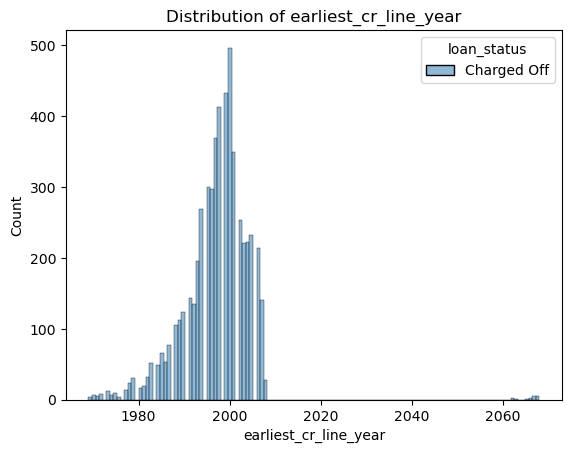

In [109]:
# Univariate analysis (Numerical columns)

for col in numerical_cols:
    # Visualize in histogram
    plot =sns.histplot(x=col,hue='loan_status', data=charged_off_df)
     # Set title for the plot
    plot.set(title=f'Distribution of {col}')
    plt.show()

In [110]:
# Here is the observation of the above Univariate analysis (Numerical columns)

# Predominantly, defaulters tend to have an employment length of 10+ years.
# Concentration of defaulted loans was observed in those sanctioned in the year 2011.
# Public records were not available for a considerable portion of applicants who defaulted on loans.
# The credit line year for a significant number of defaulted applicants centered around the year 2000.


In [111]:
result = loan_df.groupby('emp_length')['loan_status'].value_counts(normalize=True).unstack(fill_value=0) * 100
result

loan_status,Charged Off,Current,Fully Paid
emp_length,,,
0.0,13.795365,1.639703,84.564932
1.0,13.781356,2.198823,84.019820
2.0,12.802373,2.213601,84.984026
3.0,13.405088,2.030333,84.564579
4.0,15.051134,3.023566,81.925300
5.0,13.691932,2.689487,83.618582
6.0,13.734291,2.737882,83.527828
7.0,14.785553,3.498871,81.715576
8.0,13.550136,2.981030,83.468835


In [112]:
# Univariate analysis (Categorical columns)

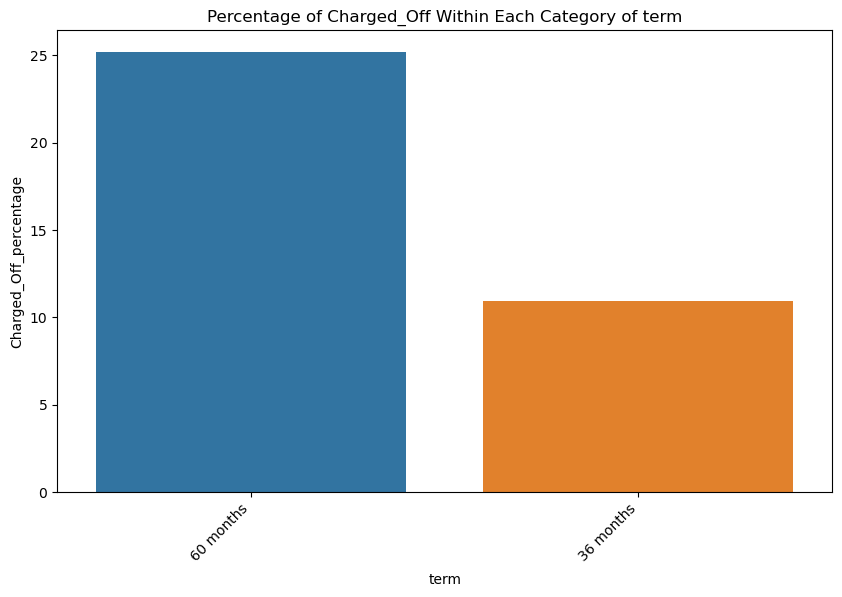

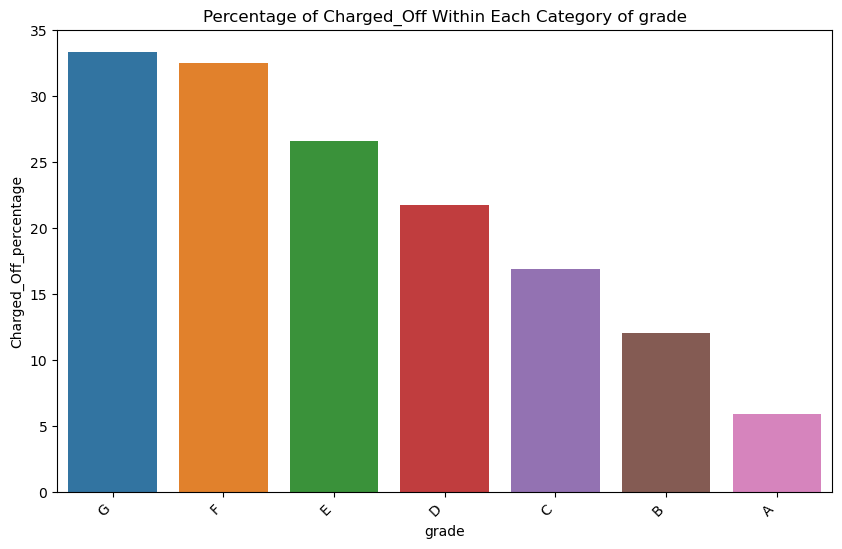

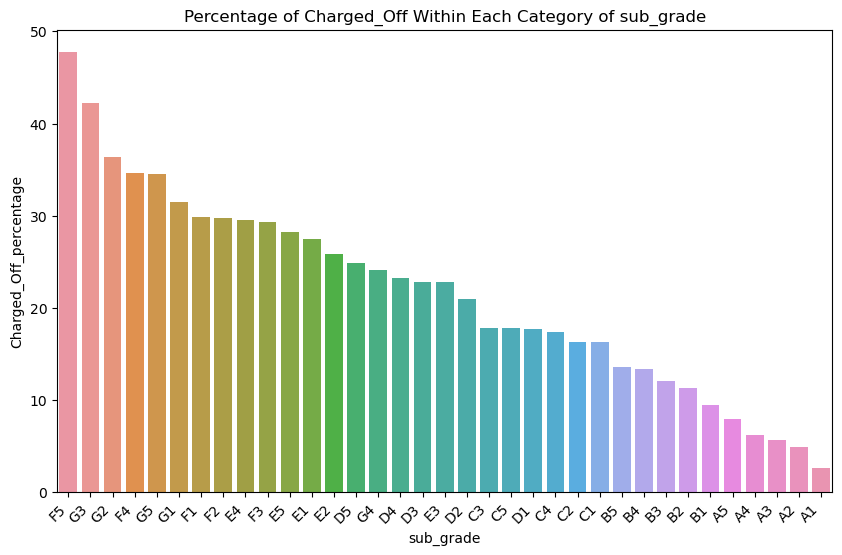

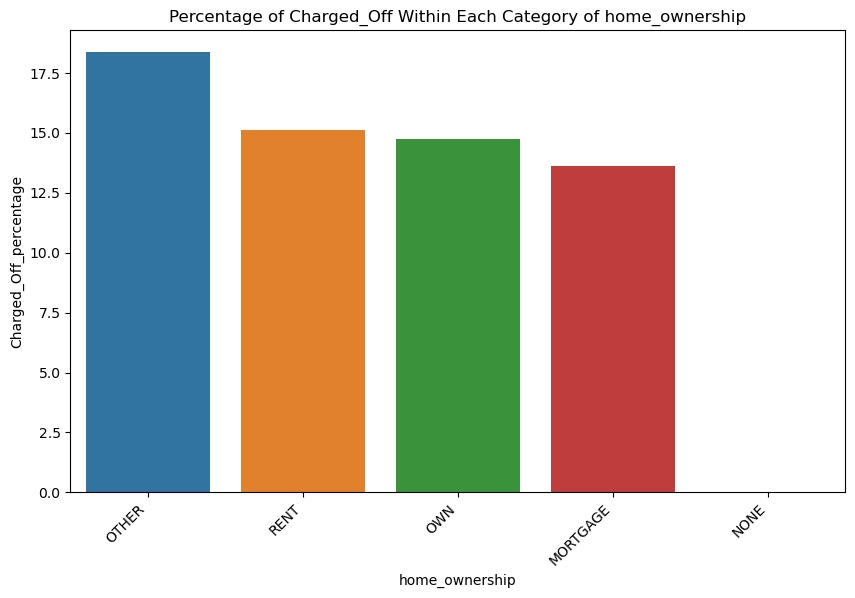

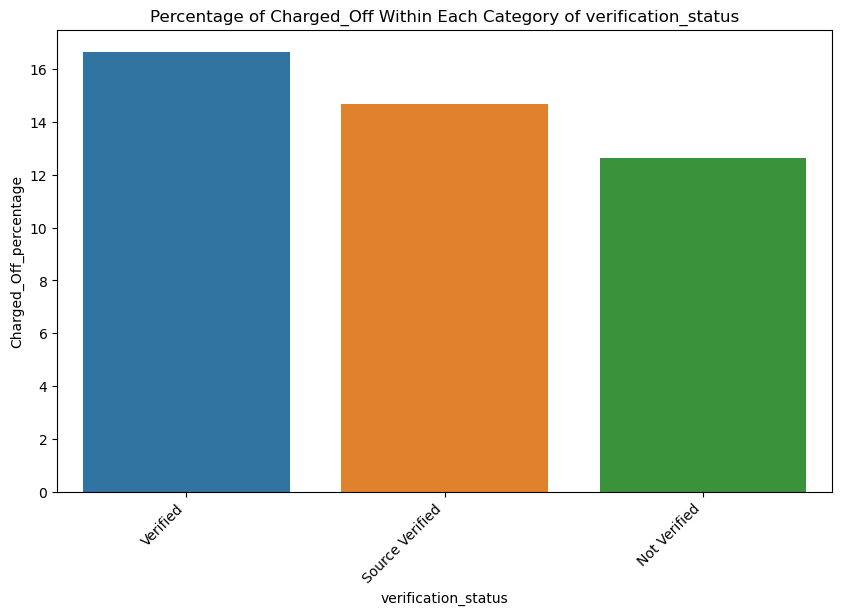

...

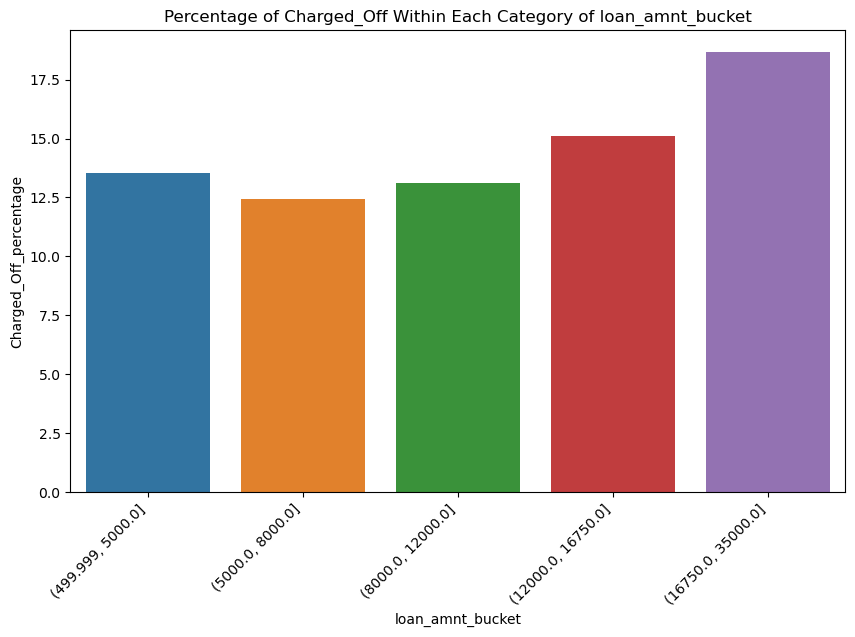

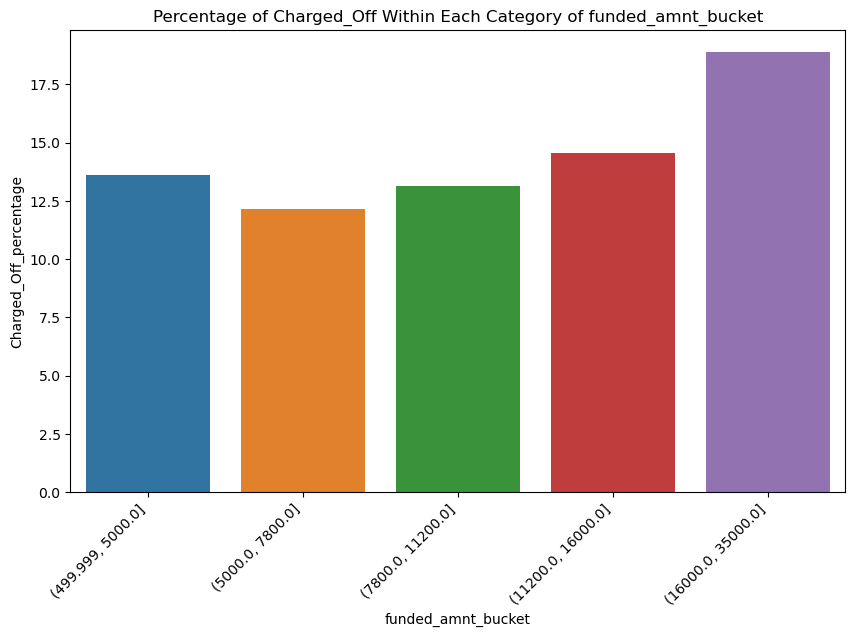

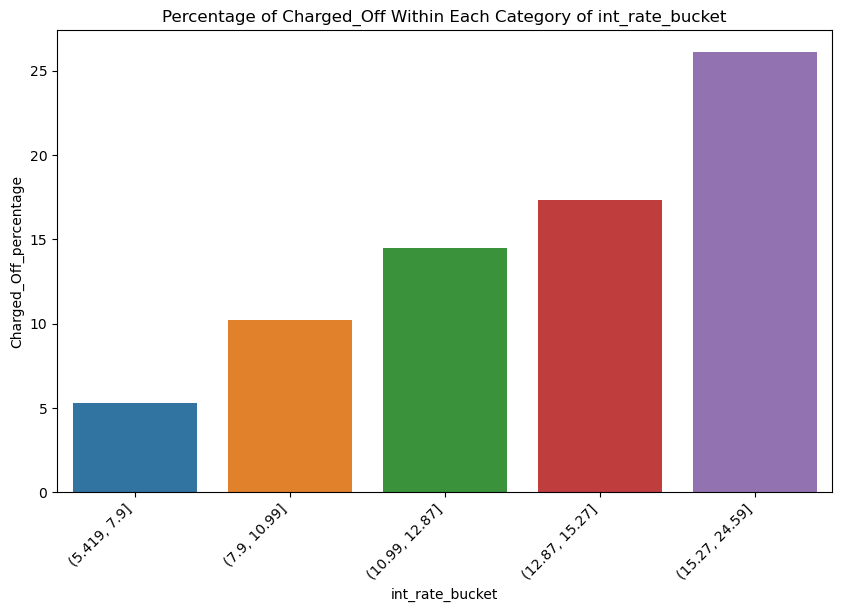

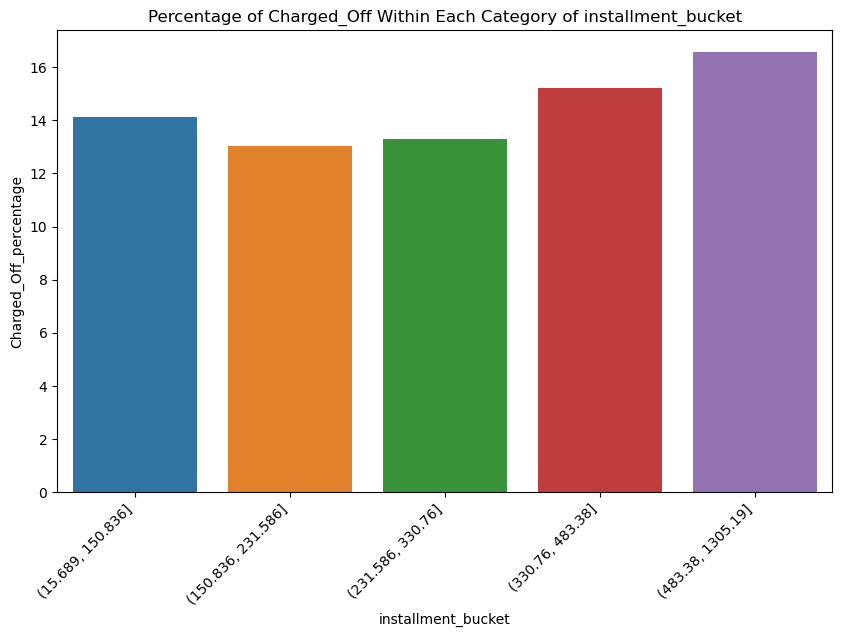

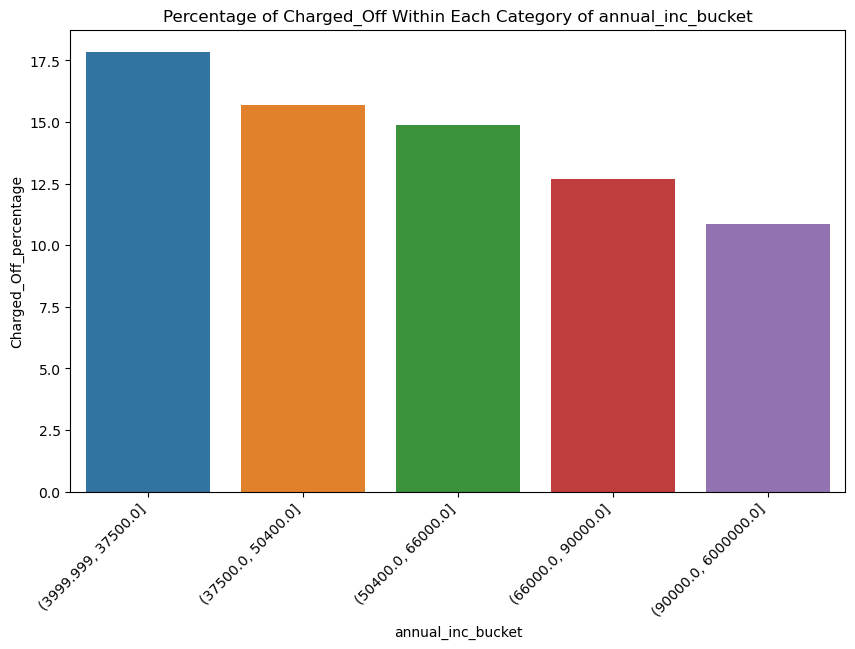

In [113]:
# Univariate analysis (Categorical columns).
# Note: We shall look into the sub sections in the category which defaulted the loan most

for col in categorical_cols:
    status_counts = loan_df.groupby([col, 'loan_status']).size().unstack(fill_value=0)
    # Calculate the percentage of Charged_Off within each category
    status_counts['Charged_Off_percentage'] = (status_counts['Charged Off'] / (status_counts['Fully Paid'] + status_counts['Charged Off'])) * 100
    # Sort the DataFrame based on Charged_Off percentage
    status_counts = status_counts.sort_values(by='Charged_Off_percentage', ascending=False)

    # Create a bar plot
    plt.figure(figsize=(10, 6))
    sns.barplot(y='Charged_Off_percentage', x=status_counts.index, data=status_counts)
    plt.xticks(rotation=45, ha='right')
    plt.title(f'Percentage of Charged_Off Within Each Category of {col}')
    plt.show()

In [114]:
# Here is the observation of the above Univariate analysis (Categorical columns)

# Loans with a term of 60 months exhibit a higher default rate.
# Grades G and F display higher default rates compared to others.
# Within G3 and F5 subcategories, default rates are notably high.
# Limited information is available for the "OTHER" category, hindering conclusive insights.
# Verified applicants exhibit a higher default rate, suggesting potential issues in the verification process.
# Loans for small_business and renewable_energy categories pose higher risks of default rate.
# States such as NE, NV are identified as having higher default rates.
# Higher Debt-to-Income Ratio (DTI) depicts an increased likelihood of charged off loans.
# Higher loan amounts are associated with a greater chance of default.
# Higher interest rates contribute to a higher rate of charged off loans.
# Larger funded amounts correspond to an increased likelihood of loans being charged off.
# Higher installment rates correspond to a higher rate of charged off loans.
# Higher annual income is linked to improved repayment likelihood


In [115]:
######################

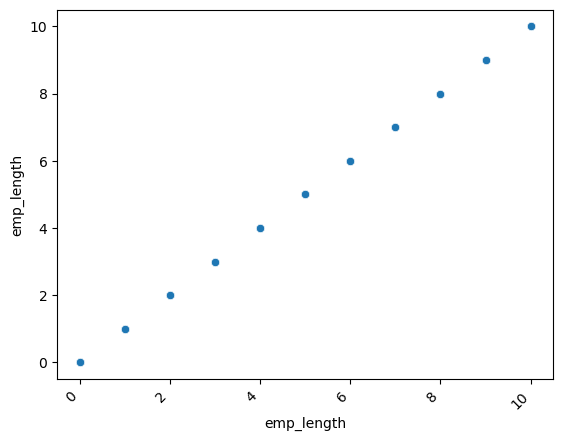

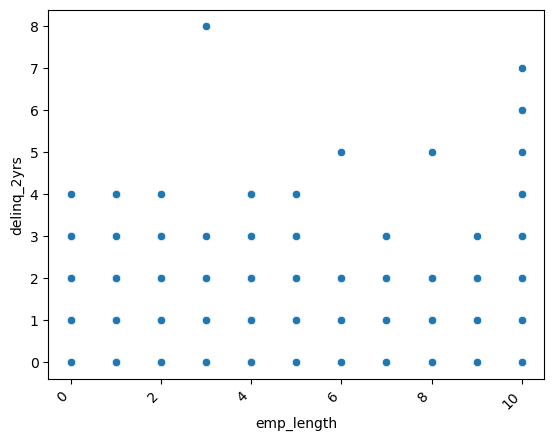

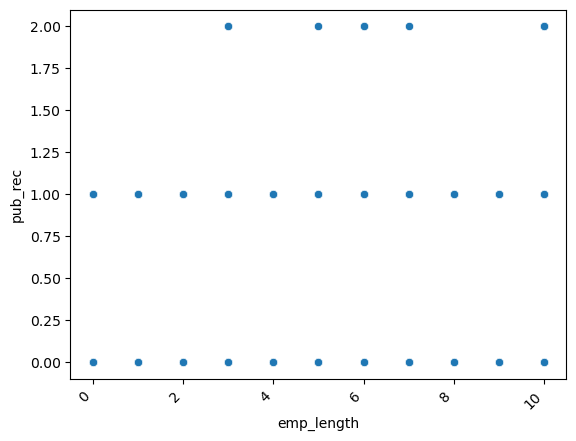

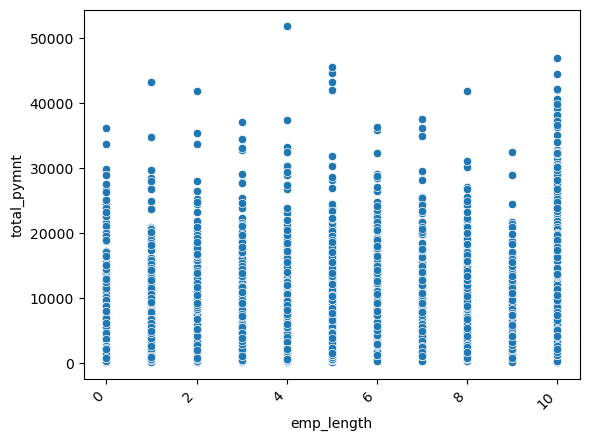

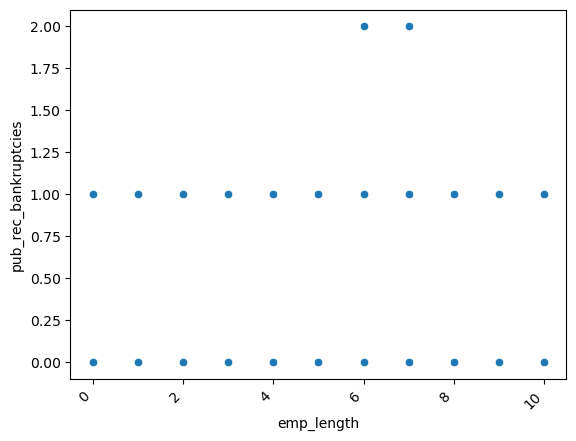

...

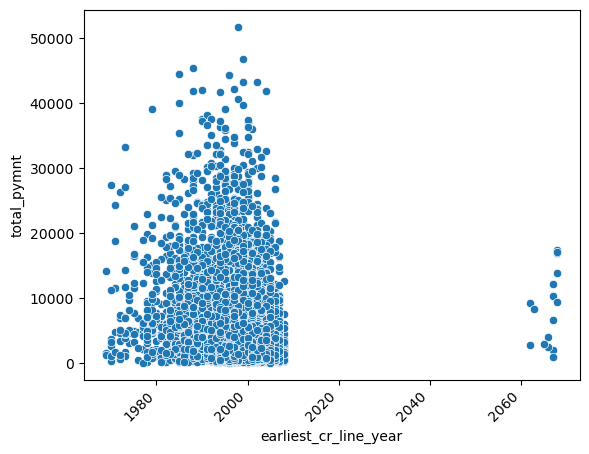

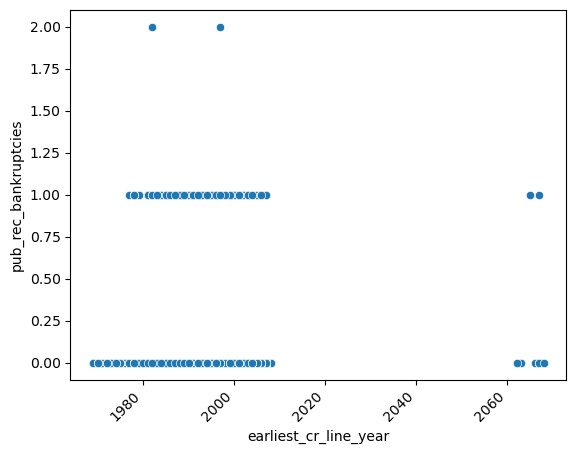

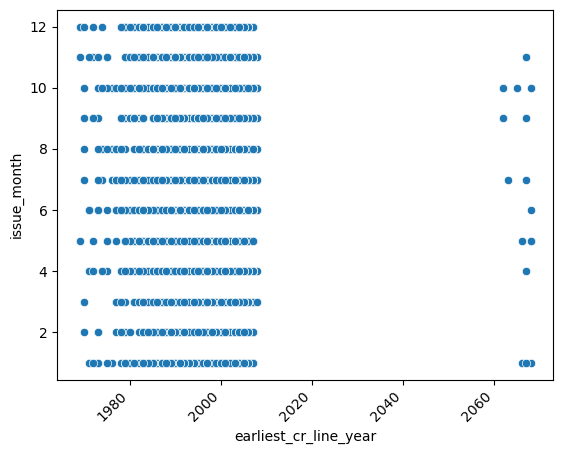

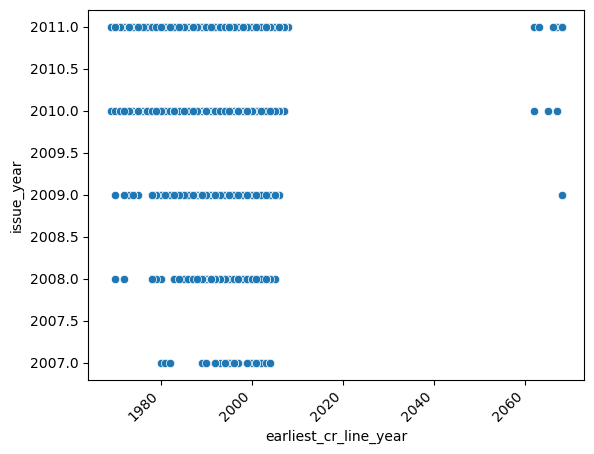

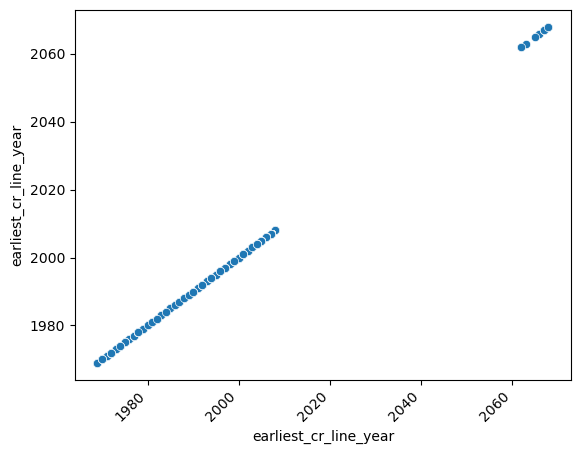

In [116]:
# Bivariate analysis (Numerical vs Numerical)
for col1 in numerical_cols:
    for col2 in numerical_cols:
        sns.scatterplot(x=charged_off_df[col1],y=charged_off_df[col2])
        plot.set(title=f'Distribution of {col1} vs {col2}')
        plt.xticks(rotation=45, ha='right')
       # plt.gcf().set_size_inches(1, 6)
        plt.show()
        

In [117]:
# No significant observartions derived from the above bivariate analysis

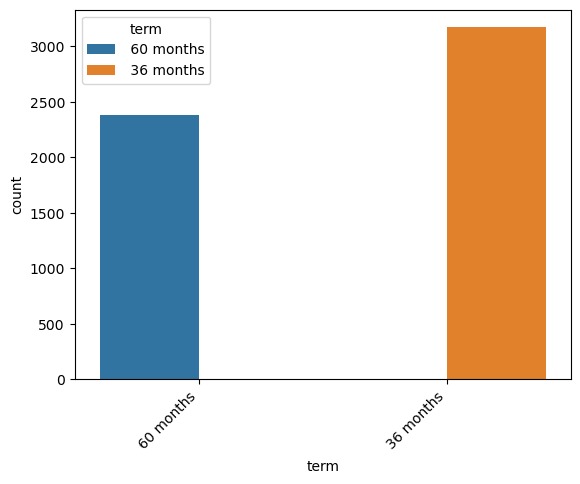

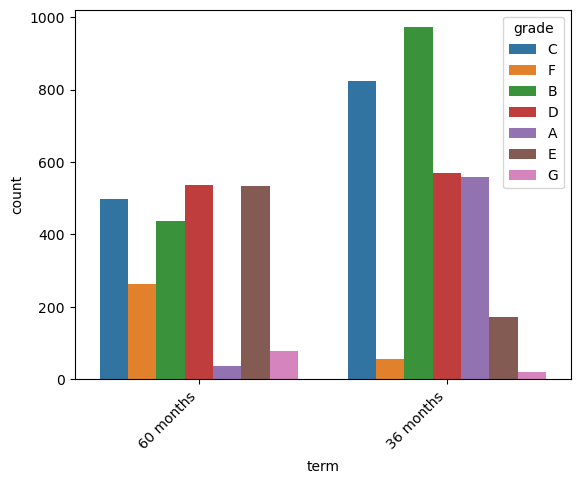

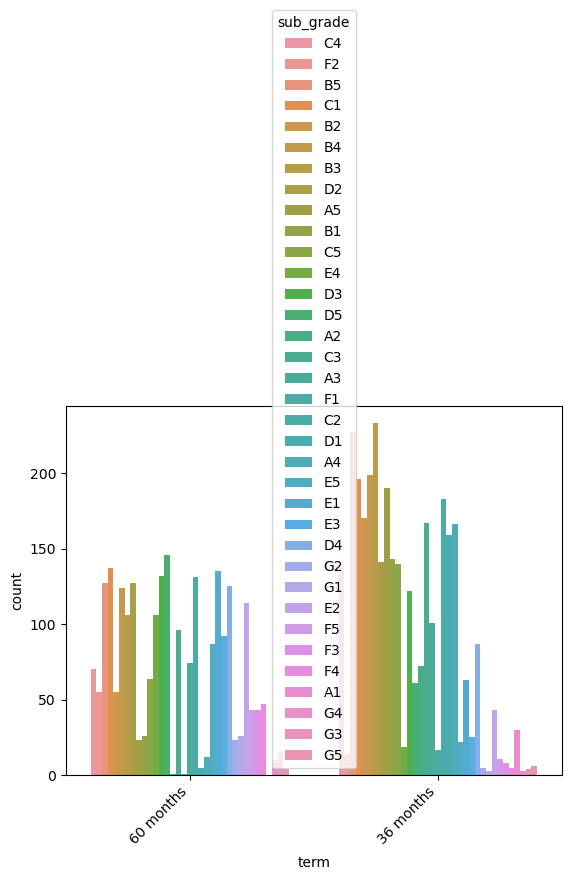

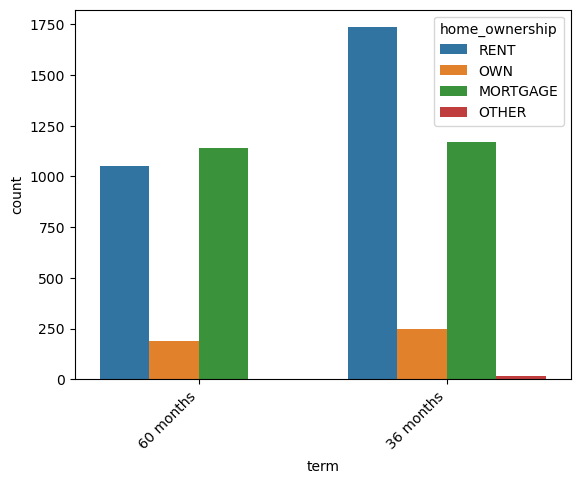

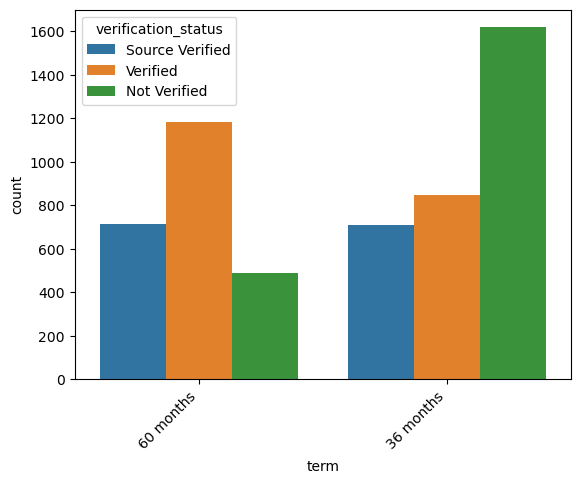

...

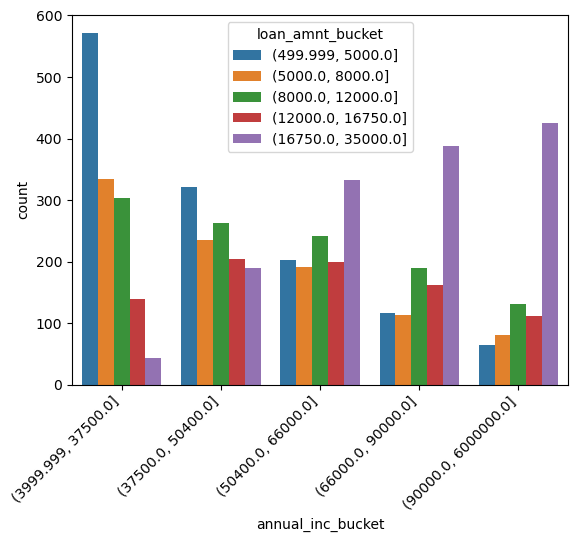

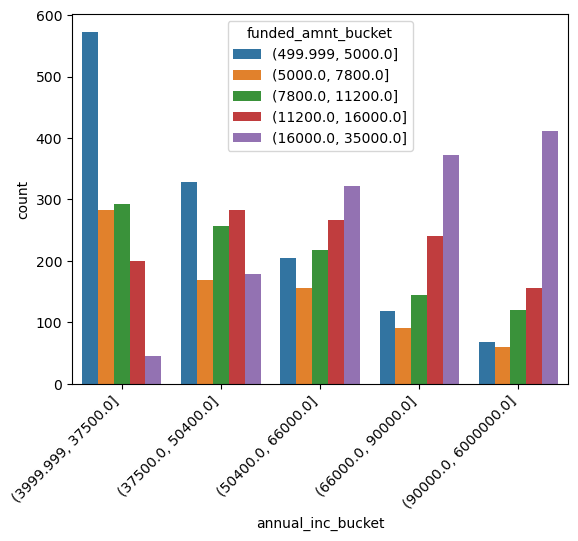

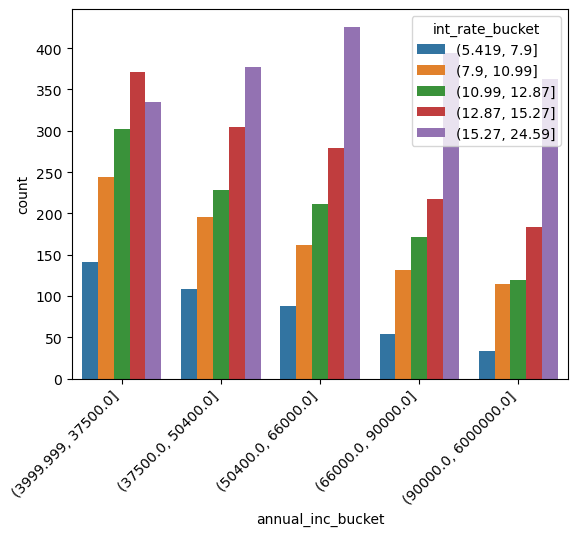

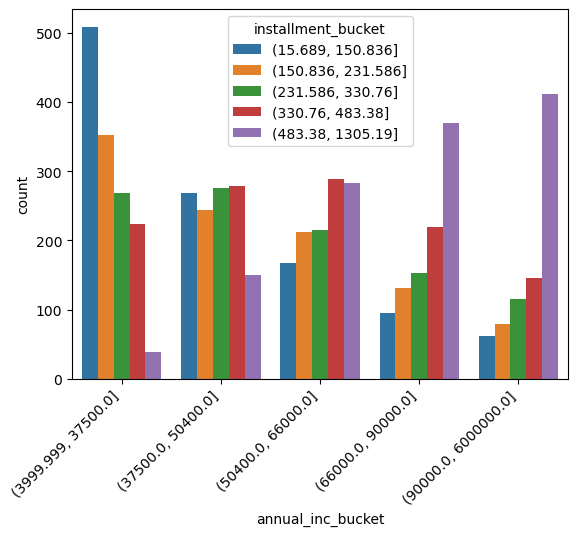

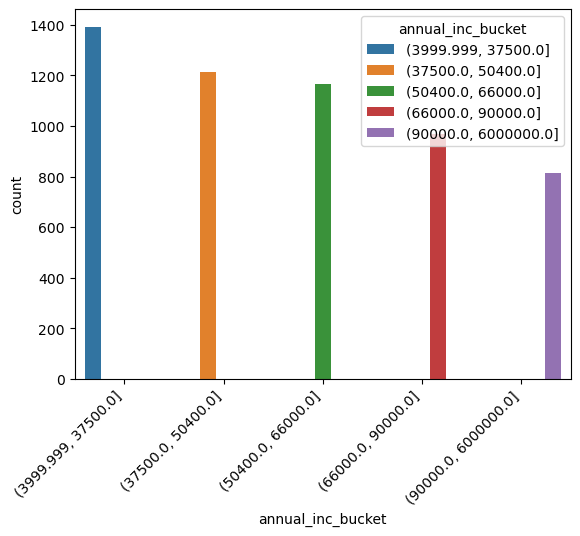

In [118]:
# Bivariate analysis (Categorical vs Categorical)
for col1 in categorical_cols:
    for col2 in categorical_cols:
        sns.countplot(x=charged_off_df[col1],hue=charged_off_df[col2])
        plot.set(title=f'Distribution of {col1} vs {col2}')
        plt.xticks(rotation=45, ha='right')
       # plt.gcf().set_size_inches(1, 6)
        plt.show()

In [119]:
# Here is the observation of the above bivariate analysis (Categorical columns)
# Higher installment along with  annual income contribute to a higher rate of charged off loans.#
# Higher interest rate along with higher annual income contribute to a higher rate of charged off loans.
# Higher annual income along with  higher funded amount contribute to a higher rate of charged off loans.
# Higher interest rate along with 60 months term contribute to a higher rate of charged off loans.
# Higher dti along with  higher funded amount contribute to a higher rate of charged off loans.

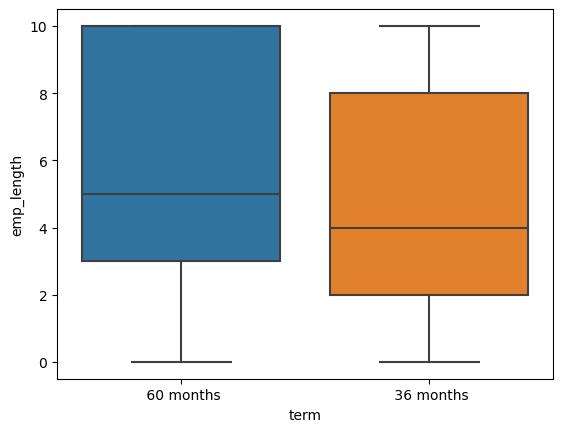

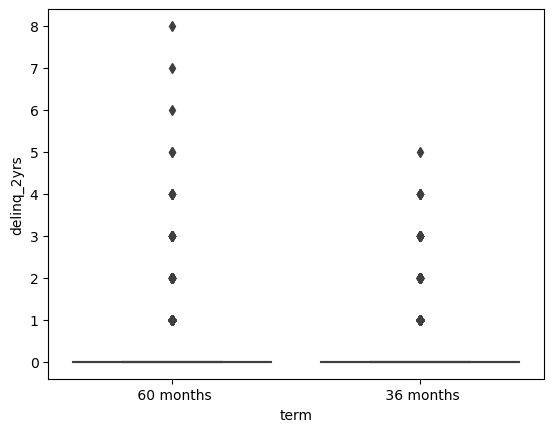

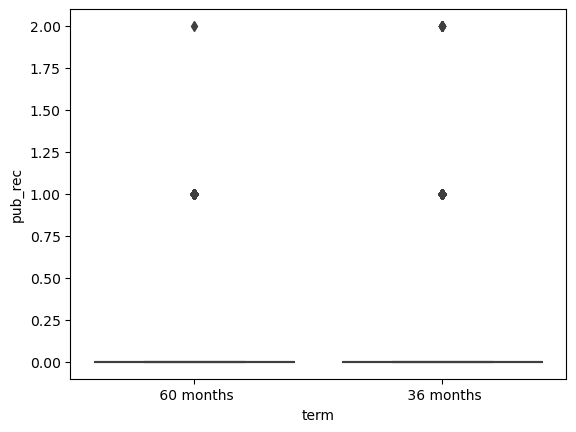

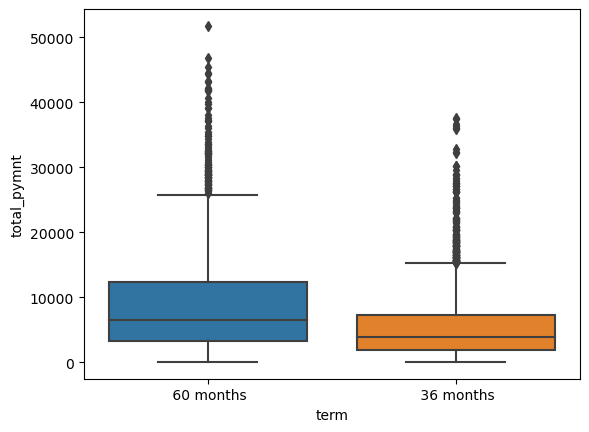

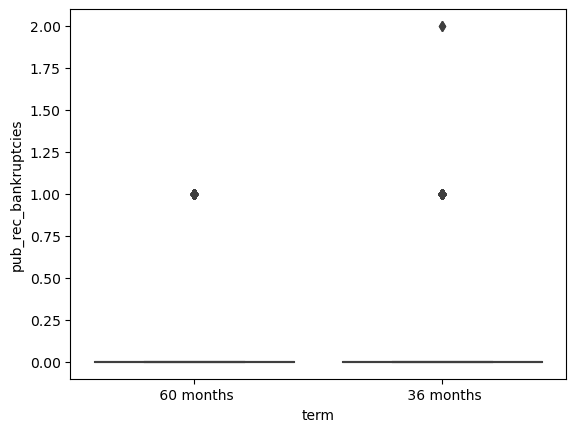

...

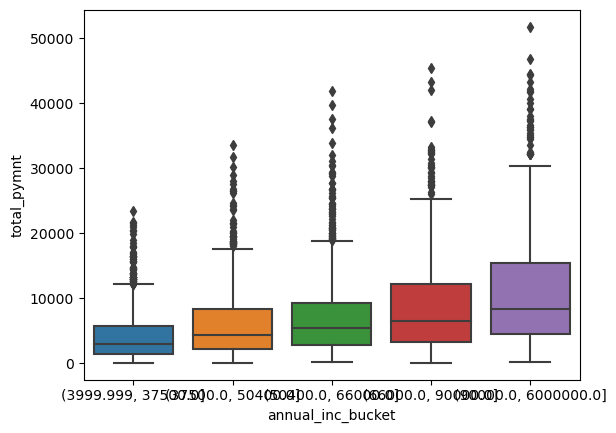

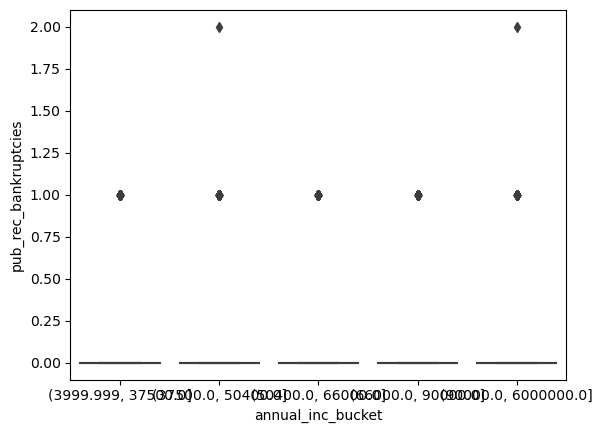

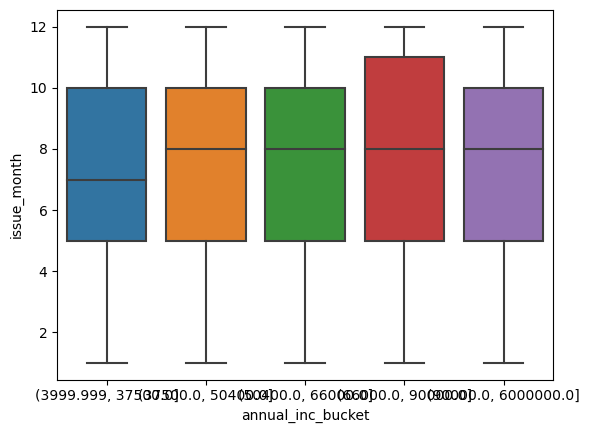

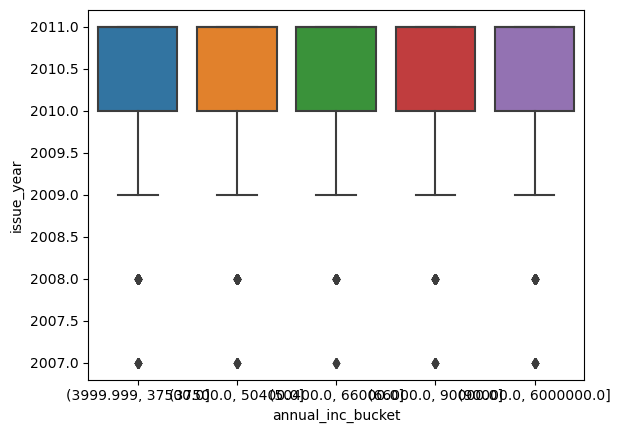

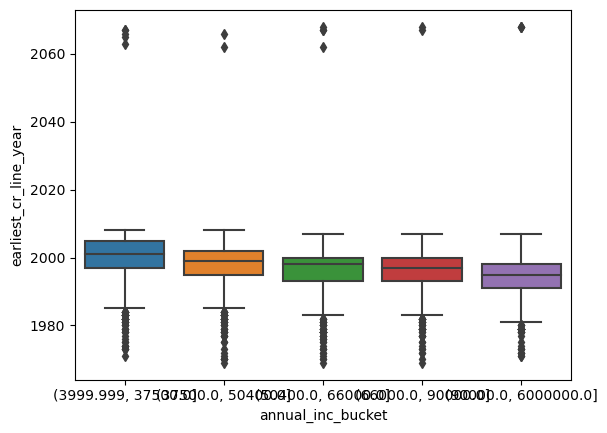

In [120]:
# Bivariate analysis (Numerical vs Categorical)
for col1 in categorical_cols:
    for col2 in numerical_cols:
        sns.boxplot(x=charged_off_df[col1],y=charged_off_df[col2])
        plt.show()

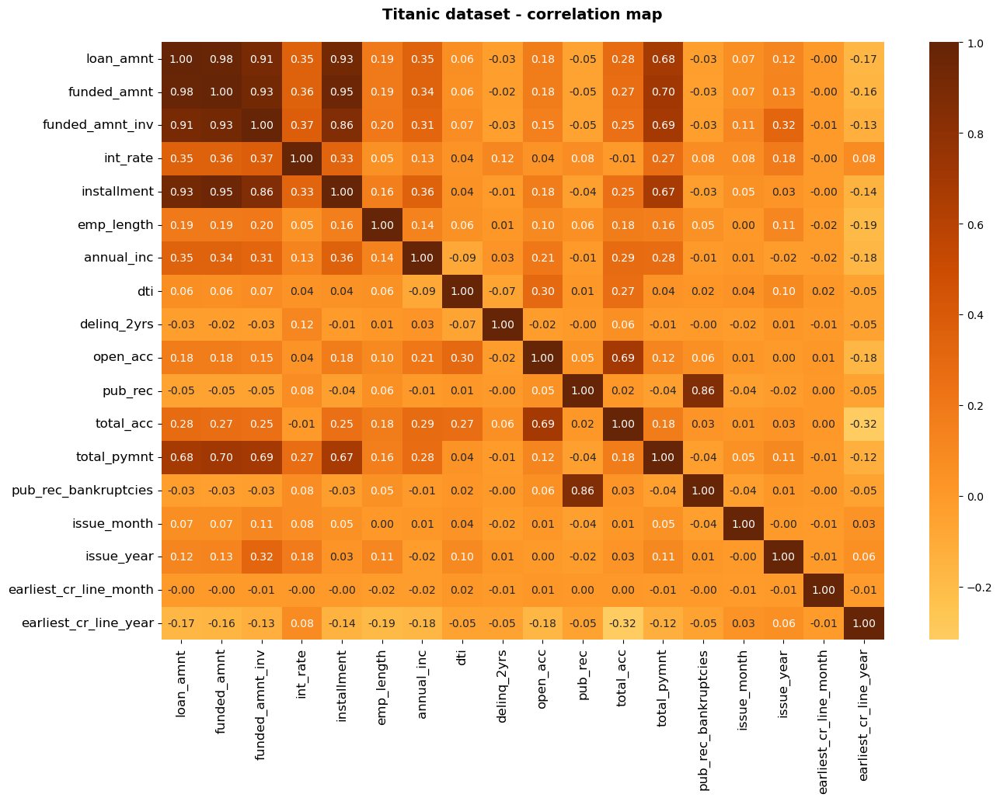

In [121]:
# Multivariate analysis
plt.figure(figsize = (15, 10) )
sns.heatmap(charged_off_df.corr(), annot = True, fmt = '.2f', cmap = 'YlOrBr', center = 0)
plt.title('Titanic dataset - correlation map\n', weight = 'bold', fontsize = 14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()     

In [126]:
# Here is the analysis of the above one
# The loan amount, funded amount, and funded amount by investors have a strong correlation with each other. 
# Installment shows a strong correlation with the loan amount, funded amount, and funded amount by investors.
